In [1]:
import numpy as np
import h5py
import json
import matplotlib.pyplot as plt
from pathlib import Path

## Load Results from HDF5 File

In [2]:
# Path to the results file
results_dir = Path('/das/home/barbaf_l/smartTT/results')

# List available h5 files
h5_files = list(results_dir.glob('*.h5'))
print("Available HDF5 files:")
for f in h5_files:
    print(f"  - {f.name}")

Available HDF5 files:
  - active_learning_test.h5
  - active_learning_results.h5


In [3]:
# Select file to load (change this to load different results)
results_path = results_dir / 'active_learning_results.h5'

# Load the HDF5 file
with h5py.File(results_path, 'r') as f:
    # Print file structure
    print("HDF5 File Structure:")
    print("=" * 50)
    
    def print_structure(name, obj):
        if isinstance(obj, h5py.Dataset):
            print(f"  Dataset: {name}, shape={obj.shape}, dtype={obj.dtype}")
        elif isinstance(obj, h5py.Group):
            print(f"  Group: {name}/")
    
    f.visititems(print_structure)
    
    print("\nAttributes:")
    for key, val in f.attrs.items():
        if key in ['history', 'projection_history']:
            print(f"  {key}: [JSON data]")
        else:
            print(f"  {key}: {val}")

HDF5 File Structure:
  Dataset: final_indices, shape=(60,), dtype=int64
  Dataset: final_mean_reconstruction, shape=(65, 82, 65, 45), dtype=float32
  Dataset: ground_truth, shape=(65, 82, 65, 45), dtype=float32
  Dataset: ground_truth_forward, shape=(240, 73, 100, 8), dtype=float32
  Group: indices_history/
  Dataset: indices_history/0000, shape=(20,), dtype=int64
  Dataset: indices_history/0001, shape=(22,), dtype=int64
  Dataset: indices_history/0002, shape=(24,), dtype=int64
  Dataset: indices_history/0003, shape=(26,), dtype=int64
  Dataset: indices_history/0004, shape=(28,), dtype=int64
  Dataset: indices_history/0005, shape=(30,), dtype=int64
  Dataset: indices_history/0006, shape=(32,), dtype=int64
  Dataset: indices_history/0007, shape=(34,), dtype=int64
  Dataset: indices_history/0008, shape=(36,), dtype=int64
  Dataset: indices_history/0009, shape=(38,), dtype=int64
  Dataset: indices_history/0010, shape=(40,), dtype=int64
  Dataset: indices_history/0011, shape=(42,), dtype=i

In [4]:
# Load all data from the HDF5 file
with h5py.File(results_path, 'r') as f:
    # Load reconstructions
    ground_truth = f['ground_truth'][:]
    final_reconstruction = f['final_mean_reconstruction'][:]
    final_indices = f['final_indices'][:]
    
    # Load ground truth forward projection if available
    if 'ground_truth_forward' in f:
        ground_truth_forward = f['ground_truth_forward'][:]
    else:
        ground_truth_forward = None
    
    # Load indices history
    indices_history = []
    if 'indices_history' in f:
        for key in sorted(f['indices_history'].keys()):
            indices_history.append(f[f'indices_history/{key}'][:])
    
    # Load selected angles history
    selected_angles_history = []
    if 'selected_angles_history' in f:
        for key in sorted(f['selected_angles_history'].keys()):
            selected_angles_history.append(f[f'selected_angles_history/{key}'][:])
    
    # Load metadata
    total_projections = f.attrs.get('total_projections', None)
    num_iterations = f.attrs.get('num_iterations', None)
    
    # Load metrics history
    history = json.loads(f.attrs['history']) if 'history' in f.attrs else []
    projection_history = json.loads(f.attrs['projection_history']) if 'projection_history' in f.attrs else []

print(f"Ground truth shape: {ground_truth.shape}")
print(f"Final reconstruction shape: {final_reconstruction.shape}")
print(f"Total projections: {total_projections}")
print(f"Number of iterations: {num_iterations}")
print(f"Final number of projection angles used: {len(final_indices)}")

Ground truth shape: (65, 82, 65, 45)
Final reconstruction shape: (65, 82, 65, 45)
Total projections: 240
Number of iterations: 20
Final number of projection angles used: 60


## Display Metrics History

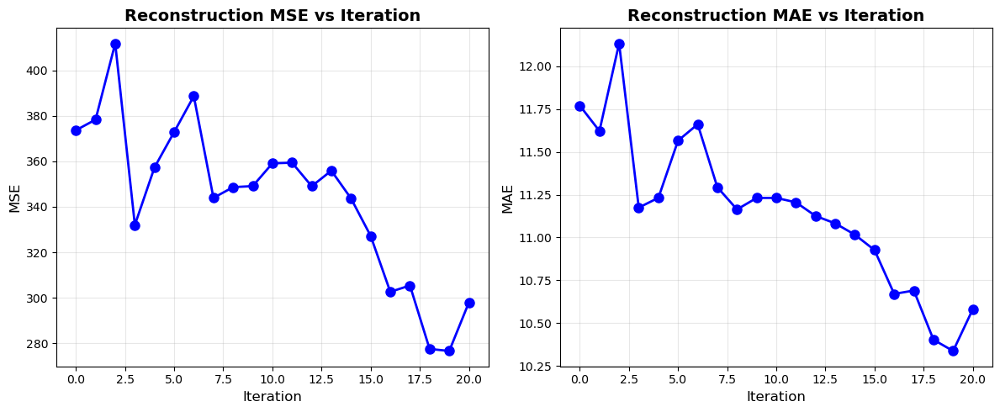

In [5]:
# Plot reconstruction metrics over iterations
if history:
    metric_names = list(history[0].keys())
    num_metrics = len(metric_names)
    
    fig, axes = plt.subplots(1, num_metrics, figsize=(6 * num_metrics, 5))
    if num_metrics == 1:
        axes = [axes]
    
    iterations = range(len(history))
    
    for i, metric_name in enumerate(metric_names):
        values = [h[metric_name] for h in history]
        axes[i].plot(iterations, values, 'o-', linewidth=2, markersize=8, color='blue')
        axes[i].set_xlabel('Iteration', fontsize=12)
        axes[i].set_ylabel(metric_name.upper(), fontsize=12)
        axes[i].set_title(f'Reconstruction {metric_name.upper()} vs Iteration', fontsize=14, fontweight='bold')
        axes[i].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
else:
    print("No reconstruction metrics history available.")

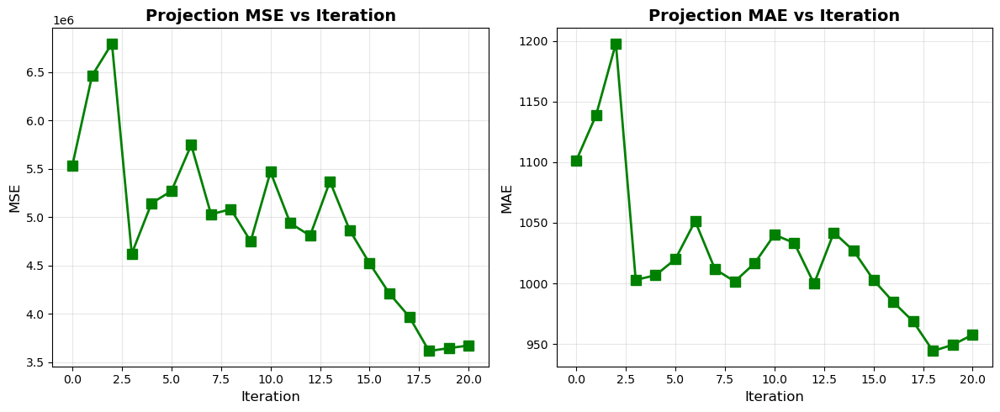

In [6]:
# Plot projection metrics over iterations (if available)
if projection_history:
    metric_names = list(projection_history[0].keys())
    num_metrics = len(metric_names)
    
    fig, axes = plt.subplots(1, num_metrics, figsize=(6 * num_metrics, 5))
    if num_metrics == 1:
        axes = [axes]
    
    iterations = range(len(projection_history))
    
    for i, metric_name in enumerate(metric_names):
        values = [h[metric_name] for h in projection_history]
        axes[i].plot(iterations, values, 's-', linewidth=2, markersize=8, color='green')
        axes[i].set_xlabel('Iteration', fontsize=12)
        axes[i].set_ylabel(metric_name.upper(), fontsize=12)
        axes[i].set_title(f'Projection {metric_name.upper()} vs Iteration', fontsize=14, fontweight='bold')
        axes[i].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
else:
    print("No projection metrics history available.")

## Display Number of Projections per Iteration

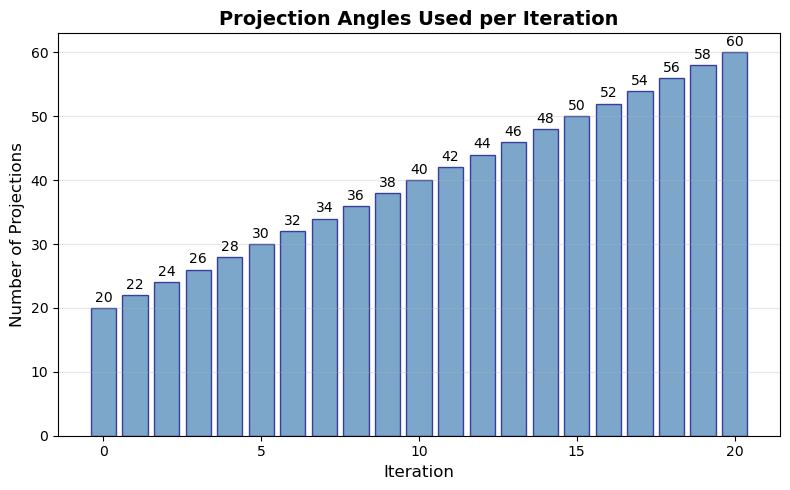


Selected angles at each iteration:
  Iteration 1: [239 202]
  Iteration 2: [44 43]
  Iteration 3: [37 38]
  Iteration 4: [115 116]
  Iteration 5: [124  48]
  Iteration 6: [49 47]
  Iteration 7: [ 50 179]
  Iteration 8: [27 28]
  Iteration 9: [190 189]
  Iteration 10: [  0 161]
  Iteration 11: [191 188]
  Iteration 12: [200 199]
  Iteration 13: [46 23]
  Iteration 14: [7 5]
  Iteration 15: [ 42 103]
  Iteration 16: [123  51]
  Iteration 17: [41 40]
  Iteration 18: [22 25]
  Iteration 19: [117 192]
  Iteration 20: [122  52]


In [7]:
# Plot number of projections used at each iteration
if indices_history:
    num_projections = [len(indices) for indices in indices_history]
    iterations = range(len(num_projections))
    
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(iterations, num_projections, color='steelblue', alpha=0.7, edgecolor='navy')
    ax.set_xlabel('Iteration', fontsize=12)
    ax.set_ylabel('Number of Projections', fontsize=12)
    ax.set_title('Projection Angles Used per Iteration', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on bars
    for i, v in enumerate(num_projections):
        ax.text(i, v + 0.5, str(v), ha='center', va='bottom', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    # Print selected angles at each iteration
    print("\nSelected angles at each iteration:")
    for i, angles in enumerate(selected_angles_history):
        print(f"  Iteration {i+1}: {angles}")
else:
    print("No indices history available.")

## 3D Visualization of Selected Angles Over Iterations

Visualize the projection angles on a 3D sphere, with a slider to see how the selected angles evolve over active learning iterations.

In [17]:
# Load geometry information from original dataset to get angle coordinates
# We need to load the DataContainer to get the projection angles

# Try to load the original dataset path from the active learning script
data_path = '/das/home/barbaf_l/p20639/Mads/frog/frogbone/dataset_qbin_0000.h5'

try:
    from mumott.data_handling import DataContainer
    dc_full = DataContainer(data_path, nonfinite_replacement_value=0)
    
    # Extract rotation and tilt angles from geometry
    rotation_angles_rad = dc_full.geometry.inner_angles[:]
    tilt_angles_rad = list(np.pi/2 - np.array(dc_full.geometry.outer_angles))[:]
    
    # Convert to Cartesian coordinates on unit sphere
    r = 1
    x_all = r * np.sin(tilt_angles_rad) * np.cos(rotation_angles_rad)
    y_all = r * np.sin(tilt_angles_rad) * np.sin(rotation_angles_rad)
    z_all = r * np.cos(tilt_angles_rad)
    
    print(f"Loaded geometry with {len(rotation_angles_rad)} projection angles")
    print(f"Cartesian coordinates computed for 3D visualization")
    
except Exception as e:
    print(f"Could not load DataContainer: {e}")
    print("Using angle indices directly (will create synthetic coordinates)")
    
    # Create synthetic coordinates based on indices
    n_angles = total_projections
    theta = np.linspace(0, 2*np.pi, n_angles, endpoint=False)
    phi = np.linspace(0.1, np.pi-0.1, n_angles)
    
    x_all = np.sin(phi) * np.cos(theta)
    y_all = np.sin(phi) * np.sin(theta)
    z_all = np.cos(phi)

INFO:Setting the number of threads to 8. If your physical cores are fewer than this number, you may want to use numba.set_num_threads(n), and os.environ["OPENBLAS_NUM_THREADS"] = f"{n}" to set the number of threads to the number of physical cores n.
INFO:Setting numba log level to WARNING.
INFO:Setting numba log level to WARNING.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


INFO:Rotation matrices were loaded from the input file.


/das/work/units/pem/p20639/envs/p20639/lib/python3.9/site-packages/mumott/data_handling/data_container.py:227: DeprecationWarning: Entry name rotations is deprecated. Use inner_angle instead.
  _deprecated_key_warning('rotations')
/das/work/units/pem/p20639/envs/p20639/lib/python3.9/site-packages/mumott/data_handling/data_container.py:236: DeprecationWarning: Entry name tilts is deprecated. Use outer_angle instead.
  _deprecated_key_warning('tilts')
/das/work/units/pem/p20639/envs/p20639/lib/python3.9/site-packages/mumott/data_handling/data_container.py:246: DeprecationWarning: Entry name rot_mat is deprecated. Use rotation_matrix instead.
  _deprecated_key_warning('rot_mat')
/das/work/units/pem/p20639/envs/p20639/lib/python3.9/site-packages/mumott/data_handling/data_container.py:268: DeprecationWarning: Entry name offset_j is deprecated. Use j_offset instead.
  _deprecated_key_warning('offset_j')
/das/work/units/pem/p20639/envs/p20639/lib/python3.9/site-packages/mumott/data_handling/d

INFO:Sample geometry loaded from file.
INFO:Detector geometry loaded from file.
Loaded geometry with 240 projection angles
Cartesian coordinates computed for 3D visualization
INFO:Detector geometry loaded from file.
Loaded geometry with 240 projection angles
Cartesian coordinates computed for 3D visualization


In [18]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create sphere surface for visualization
u = np.linspace(0, 2 * np.pi, 50)
v = np.linspace(0, np.pi, 50)
x_sphere = np.outer(np.cos(u), np.sin(v))
y_sphere = np.outer(np.sin(u), np.sin(v))
z_sphere = np.outer(np.ones(np.size(u)), np.cos(v))

# Create the figure with slider
fig = go.Figure()

# Add translucent sphere
fig.add_trace(go.Surface(
    x=x_sphere, y=y_sphere, z=z_sphere,
    colorscale=[[0, 'lightcyan'], [1, 'lightcyan']],
    opacity=0.1,
    showscale=False,
    name='Sphere'
))

# Create frames for each iteration
frames = []
num_iterations_to_show = len(indices_history)

for iter_idx in range(num_iterations_to_show):
    current_indices = indices_history[iter_idx]
    
    # Get coordinates for current angles
    x_current = np.array([x_all[i] for i in current_indices])
    y_current = np.array([y_all[i] for i in current_indices])
    z_current = np.array([z_all[i] for i in current_indices])
    
    # Identify newly added angles (except for first iteration)
    if iter_idx > 0:
        prev_indices = set(indices_history[iter_idx - 1])
        new_angles = [i for i in current_indices if i not in prev_indices]
        x_new = np.array([x_all[i] for i in new_angles]) if new_angles else np.array([])
        y_new = np.array([y_all[i] for i in new_angles]) if new_angles else np.array([])
        z_new = np.array([z_all[i] for i in new_angles]) if new_angles else np.array([])
    else:
        x_new, y_new, z_new = np.array([]), np.array([]), np.array([])
    
    frame_data = [
        # Sphere (unchanged)
        go.Surface(
            x=x_sphere, y=y_sphere, z=z_sphere,
            colorscale=[[0, 'lightcyan'], [1, 'lightcyan']],
            opacity=0.1,
            showscale=False
        ),
        # All selected angles (blue)
        go.Scatter3d(
            x=x_current, y=y_current, z=z_current,
            mode='markers',
            marker=dict(size=6, color='blue', opacity=0.7),
            name=f'Selected ({len(current_indices)})'
        ),
        # Newly added angles (red, larger)
        go.Scatter3d(
            x=x_new, y=y_new, z=z_new,
            mode='markers',
            marker=dict(size=12, color='red', symbol='diamond', opacity=1.0,
                       line=dict(color='darkred', width=2)),
            name=f'New ({len(x_new)})'
        )
    ]
    
    frames.append(go.Frame(data=frame_data, name=str(iter_idx)))

# Add initial data (iteration 0)
initial_indices = indices_history[0]
x_init = np.array([x_all[i] for i in initial_indices])
y_init = np.array([y_all[i] for i in initial_indices])
z_init = np.array([z_all[i] for i in initial_indices])

fig.add_trace(go.Scatter3d(
    x=x_init, y=y_init, z=z_init,
    mode='markers',
    marker=dict(size=6, color='blue', opacity=0.7),
    name=f'Selected ({len(initial_indices)})'
))

fig.add_trace(go.Scatter3d(
    x=[], y=[], z=[],
    mode='markers',
    marker=dict(size=12, color='red', symbol='diamond', opacity=1.0),
    name='New (0)'
))

fig.frames = frames

# Create slider
sliders = [dict(
    active=0,
    yanchor="top",
    xanchor="left",
    currentvalue=dict(
        font=dict(size=16),
        prefix="Iteration: ",
        visible=True,
        xanchor="right"
    ),
    transition=dict(duration=300, easing="cubic-in-out"),
    pad=dict(b=10, t=50),
    len=0.9,
    x=0.1,
    y=0,
    steps=[dict(
        args=[[str(i)], dict(
            frame=dict(duration=300, redraw=True),
            mode="immediate",
            transition=dict(duration=300)
        )],
        label=str(i),
        method="animate"
    ) for i in range(num_iterations_to_show)]
)]

# Add play/pause buttons
updatemenus = [dict(
    type="buttons",
    showactive=False,
    y=0,
    x=0.1,
    xanchor="right",
    yanchor="top",
    pad=dict(t=50, r=10),
    buttons=[
        dict(
            label="▶ Play",
            method="animate",
            args=[None, dict(
                frame=dict(duration=500, redraw=True),
                fromcurrent=True,
                transition=dict(duration=300, easing="quadratic-in-out")
            )]
        ),
        dict(
            label="⏸ Pause",
            method="animate",
            args=[[None], dict(
                frame=dict(duration=0, redraw=False),
                mode="immediate",
                transition=dict(duration=0)
            )]
        )
    ]
)]

fig.update_layout(
    title=dict(
        text="Active Learning: Projection Angles Selected Over Iterations",
        font=dict(size=18)
    ),
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='cube',
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.0))
    ),
    sliders=sliders,
    updatemenus=updatemenus,
    showlegend=True,
    legend=dict(x=0.85, y=0.95),
    width=900,
    height=700
)

fig.show()

In [19]:
# Print detailed information about angles selected at each iteration
print("=" * 70)
print("ANGLE SELECTION HISTORY")
print("=" * 70)

for iter_idx in range(len(indices_history)):
    current_count = len(indices_history[iter_idx])
    
    if iter_idx == 0:
        print(f"\nIteration {iter_idx} (Initial): {current_count} angles")
        print(f"  Indices: {indices_history[iter_idx][:10]}..." if current_count > 10 else f"  Indices: {indices_history[iter_idx]}")
    else:
        prev_indices = set(indices_history[iter_idx - 1])
        new_angles = [i for i in indices_history[iter_idx] if i not in prev_indices]
        print(f"\nIteration {iter_idx}: {current_count} angles (+{len(new_angles)} new)")
        print(f"  Newly added angles: {new_angles}")

print("\n" + "=" * 70)
print(f"Total iterations: {len(indices_history)}")
print(f"Final angle count: {len(indices_history[-1])}")
print("=" * 70)

ANGLE SELECTION HISTORY

Iteration 0 (Initial): 20 angles
  Indices: [  6   9  15  24  45  86  93 104 109 113]...

Iteration 1: 22 angles (+2 new)
  Newly added angles: [202, 239]

Iteration 2: 24 angles (+2 new)
  Newly added angles: [43, 44]

Iteration 3: 26 angles (+2 new)
  Newly added angles: [37, 38]

Iteration 4: 28 angles (+2 new)
  Newly added angles: [115, 116]

Iteration 5: 30 angles (+2 new)
  Newly added angles: [48, 124]

Iteration 6: 32 angles (+2 new)
  Newly added angles: [47, 49]

Iteration 7: 34 angles (+2 new)
  Newly added angles: [50, 179]

Iteration 8: 36 angles (+2 new)
  Newly added angles: [27, 28]

Iteration 9: 38 angles (+2 new)
  Newly added angles: [189, 190]

Iteration 10: 40 angles (+2 new)
  Newly added angles: [0, 161]

Iteration 11: 42 angles (+2 new)
  Newly added angles: [188, 191]

Iteration 12: 44 angles (+2 new)
  Newly added angles: [199, 200]

Iteration 13: 46 angles (+2 new)
  Newly added angles: [23, 46]

Iteration 14: 48 angles (+2 new)
  Ne

# Variability history

In [ ]:
# Load variability history if available
variability_history = None

with h5py.File(results_path, 'r') as f:
    if 'variability_history' in f:
        variability_history = f['variability_history'][:]
        print(f"Variability history loaded!")
        print(f"  Shape: {variability_history.shape} (iterations x num_angles)")
    else:
        print("Variability history not found in this HDF5 file.")
        print("This data is saved by the updated active_learning.py script.")
        print("Re-run the active learning script to generate this data.")

In [ ]:
# Plot 2D heatmap of variability over iterations
if variability_history is not None:
    fig, ax = plt.subplots(figsize=(14, 8))
    
    im = ax.imshow(variability_history, aspect='auto', cmap='hot', 
                   interpolation='nearest')
    
    ax.set_xlabel('Projection Angle Index', fontsize=12)
    ax.set_ylabel('Iteration', fontsize=12)
    ax.set_title('Variability per Angle Over Active Learning Iterations', 
                 fontsize=14, fontweight='bold')
    
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Variability (Sum of Squared Std)', fontsize=11)
    
    # Mark selected angles at each iteration with white stars
    for iter_idx in range(len(selected_angles_history)):
        for angle in selected_angles_history[iter_idx]:
            ax.plot(angle, iter_idx, 'w*', markersize=10, markeredgecolor='black')
    
    plt.tight_layout()
    plt.show()

In [ ]:
# Interactive Plotly heatmap with hover info
if variability_history is not None:
    import plotly.express as px
    
    fig = px.imshow(
        variability_history,
        labels=dict(x="Projection Angle Index", y="Iteration", color="Variability"),
        title="Variability per Angle Over Active Learning Iterations",
        color_continuous_scale='Hot',
        aspect='auto'
    )
    
    # Add markers for selected angles
    selected_x = []
    selected_y = []
    for iter_idx, angles in enumerate(selected_angles_history):
        for angle in angles:
            selected_x.append(angle)
            selected_y.append(iter_idx)
    
    fig.add_trace(go.Scatter(
        x=selected_x, y=selected_y,
        mode='markers',
        marker=dict(symbol='star', size=12, color='cyan', 
                    line=dict(color='black', width=1)),
        name='Selected Angles'
    ))
    
    fig.update_layout(width=1000, height=500)
    fig.show()

## Visualize Reconstructions

In [8]:
# Get the middle slice for visualization
volume_shape = ground_truth.shape[:3]
mid_z = volume_shape[0] // 2
mid_y = volume_shape[1] // 2
mid_x = volume_shape[2] // 2

print(f"Volume shape: {volume_shape}")
print(f"Number of SH coefficients: {ground_truth.shape[-1]}")
print(f"Middle slices: z={mid_z}, y={mid_y}, x={mid_x}")

Volume shape: (65, 82, 65)
Number of SH coefficients: 45
Middle slices: z=32, y=41, x=32


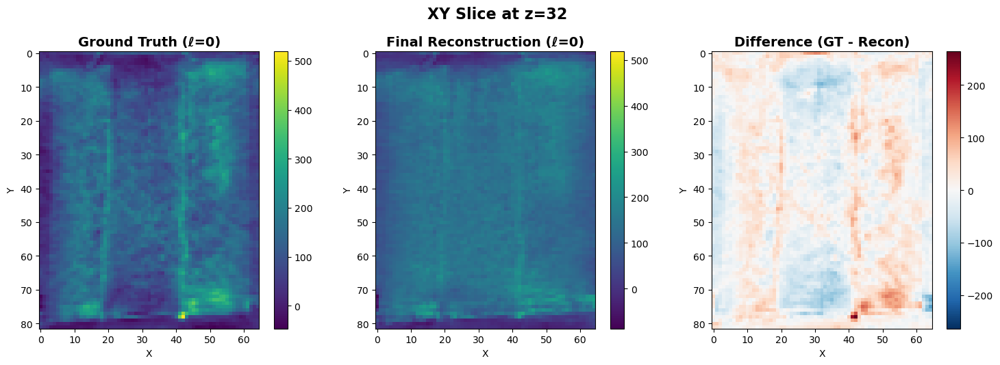

In [13]:
# Visualize the ℓ=0 coefficient (isotropic component) - XY slice
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Ground truth
gt_slice = ground_truth[mid_z, :, :, 0]
im0 = axes[0].imshow(gt_slice, cmap='viridis')
axes[0].set_title('Ground Truth (ℓ=0)', fontsize=14, fontweight='bold')
axes[0].set_xlabel('X')
axes[0].set_ylabel('Y')
plt.colorbar(im0, ax=axes[0])

# Final reconstruction
recon_slice = final_reconstruction[mid_z, :, :, 0]
im1 = axes[1].imshow(recon_slice, cmap='viridis', vmax = gt_slice.max().item())
axes[1].set_title('Final Reconstruction (ℓ=0)', fontsize=14, fontweight='bold')
axes[1].set_xlabel('X')
axes[1].set_ylabel('Y')
plt.colorbar(im1, ax=axes[1])

# Difference
diff_slice = gt_slice - recon_slice
vmax = np.max(np.abs(diff_slice))
im2 = axes[2].imshow(diff_slice, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
axes[2].set_title('Difference (GT - Recon)', fontsize=14, fontweight='bold')
axes[2].set_xlabel('X')
axes[2].set_ylabel('Y')
plt.colorbar(im2, ax=axes[2])

plt.suptitle(f'XY Slice at z={mid_z}', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

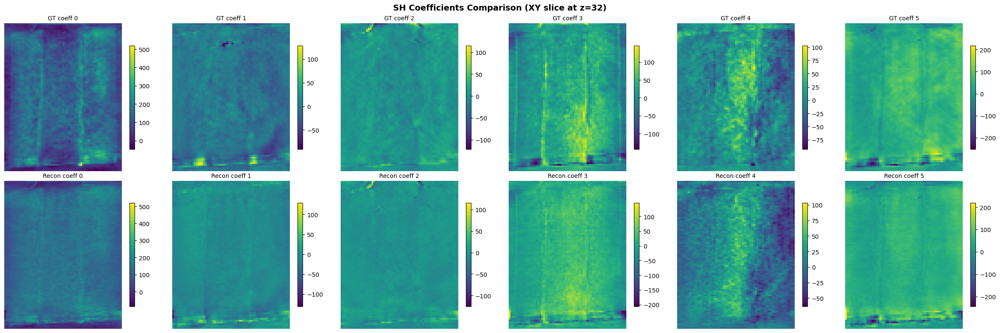

In [15]:
# Visualize multiple SH coefficients
num_coeffs_to_show = min(6, ground_truth.shape[-1])

fig, axes = plt.subplots(2, num_coeffs_to_show, figsize=(4 * num_coeffs_to_show, 8))

for i in range(num_coeffs_to_show):
    # Ground truth
    gt_slice = ground_truth[mid_z, :, :, i]
    im = axes[0, i].imshow(gt_slice, cmap='viridis')
    axes[0, i].set_title(f'GT coeff {i}', fontsize=10)
    axes[0, i].axis('off')
    plt.colorbar(im, ax=axes[0, i], shrink=0.7)
    
    # Final reconstruction
    recon_slice = final_reconstruction[mid_z, :, :, i]
    im = axes[1, i].imshow(recon_slice, cmap='viridis', vmax = gt_slice.max().item())
    axes[1, i].set_title(f'Recon coeff {i}', fontsize=10)
    axes[1, i].axis('off')
    plt.colorbar(im, ax=axes[1, i], shrink=0.7)

axes[0, 0].set_ylabel('Ground Truth', fontsize=12)
axes[1, 0].set_ylabel('Reconstruction', fontsize=12)

plt.suptitle(f'SH Coefficients Comparison (XY slice at z={mid_z})', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

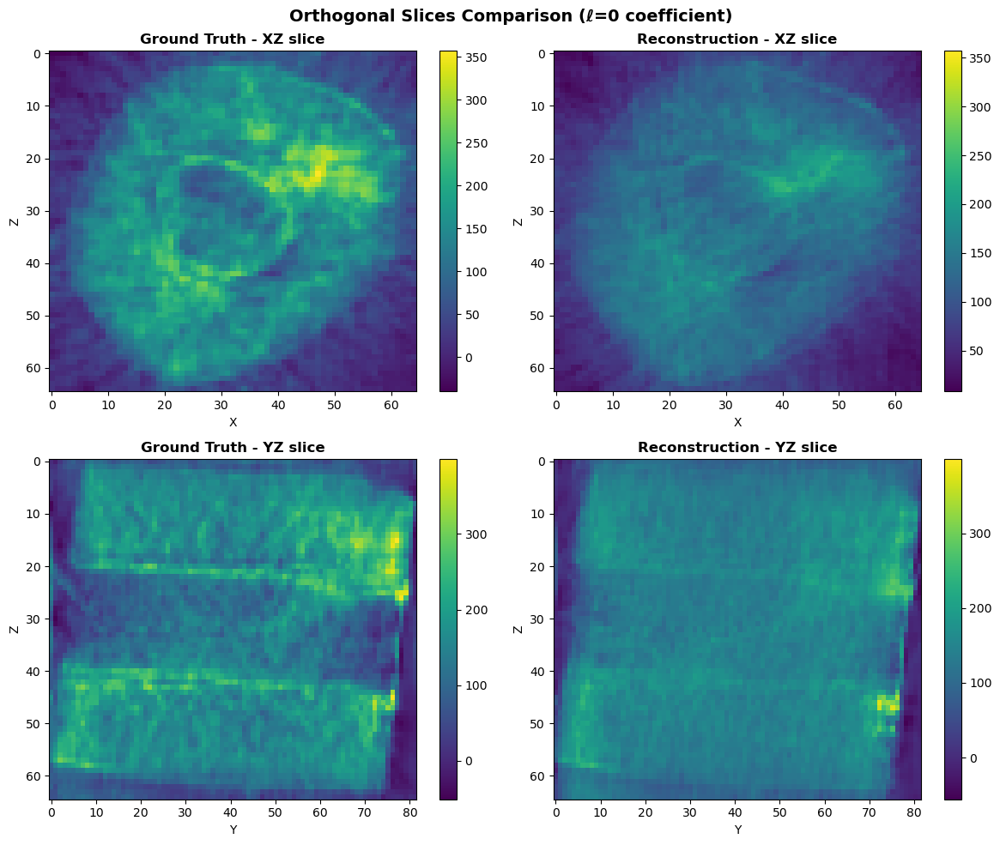

In [16]:
# Visualize orthogonal slices (XZ and YZ)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# XZ slice (ground truth)
gt_xz = ground_truth[:, mid_y, :, 0]
im = axes[0, 0].imshow(gt_xz, cmap='viridis', aspect='auto')
axes[0, 0].set_title('Ground Truth - XZ slice', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('X')
axes[0, 0].set_ylabel('Z')
plt.colorbar(im, ax=axes[0, 0])

# XZ slice (reconstruction)
recon_xz = final_reconstruction[:, mid_y, :, 0]
im = axes[0, 1].imshow(recon_xz, cmap='viridis', aspect='auto', vmax=gt_xz.max())
axes[0, 1].set_title('Reconstruction - XZ slice', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('X')
axes[0, 1].set_ylabel('Z')
plt.colorbar(im, ax=axes[0, 1])

# YZ slice (ground truth)
gt_yz = ground_truth[:, :, mid_x, 0]
im = axes[1, 0].imshow(gt_yz, cmap='viridis', aspect='auto')
axes[1, 0].set_title('Ground Truth - YZ slice', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Y')
axes[1, 0].set_ylabel('Z')
plt.colorbar(im, ax=axes[1, 0])

# YZ slice (reconstruction)
recon_yz = final_reconstruction[:, :, mid_x, 0]
im = axes[1, 1].imshow(recon_yz, cmap='viridis', aspect='auto', vmax=gt_yz.max())
axes[1, 1].set_title('Reconstruction - YZ slice', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Y')
axes[1, 1].set_ylabel('Z')
plt.colorbar(im, ax=axes[1, 1])

plt.suptitle('Orthogonal Slices Comparison (ℓ=0 coefficient)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Summary Statistics

In [12]:
# Compute summary statistics
print("=" * 60)
print("ACTIVE LEARNING RESULTS SUMMARY")
print("=" * 60)
print(f"\nTotal available projections: {total_projections}")
print(f"Number of iterations: {num_iterations}")
print(f"Final projections used: {len(final_indices)} ({100*len(final_indices)/total_projections:.1f}%)")

if indices_history:
    print(f"\nProjection count progression:")
    for i, indices in enumerate(indices_history):
        print(f"  Iteration {i}: {len(indices)} projections")

# Compute final errors
mse = np.mean((final_reconstruction - ground_truth) ** 2)
mae = np.mean(np.abs(final_reconstruction - ground_truth))
relative_error = np.linalg.norm(final_reconstruction - ground_truth) / np.linalg.norm(ground_truth)

print(f"\nFinal Reconstruction Quality:")
print(f"  MSE: {mse:.6e}")
print(f"  MAE: {mae:.6e}")
print(f"  Relative L2 Error: {relative_error:.4f} ({100*relative_error:.2f}%)")

if history:
    print(f"\nMetrics Evolution:")
    for metric_name in history[0].keys():
        initial = history[0][metric_name]
        final = history[-1][metric_name]
        improvement = (initial - final) / initial * 100
        print(f"  {metric_name.upper()}: {initial:.6e} → {final:.6e} ({improvement:+.1f}% improvement)")

print("\n" + "=" * 60)

ACTIVE LEARNING RESULTS SUMMARY

Total available projections: 240
Number of iterations: 20
Final projections used: 60 (25.0%)

Projection count progression:
  Iteration 0: 20 projections
  Iteration 1: 22 projections
  Iteration 2: 24 projections
  Iteration 3: 26 projections
  Iteration 4: 28 projections
  Iteration 5: 30 projections
  Iteration 6: 32 projections
  Iteration 7: 34 projections
  Iteration 8: 36 projections
  Iteration 9: 38 projections
  Iteration 10: 40 projections
  Iteration 11: 42 projections
  Iteration 12: 44 projections
  Iteration 13: 46 projections
  Iteration 14: 48 projections
  Iteration 15: 50 projections
  Iteration 16: 52 projections
  Iteration 17: 54 projections
  Iteration 18: 56 projections
  Iteration 19: 58 projections
  Iteration 20: 60 projections

Final Reconstruction Quality:
  MSE: 2.979264e+02
  MAE: 1.058078e+01
  Relative L2 Error: 0.5897 (58.97%)

Metrics Evolution:
  MSE: 3.736502e+02 → 2.979264e+02 (+20.3% improvement)
  MAE: 1.177026e+0